In [2]:
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/path/to/creds.json"
import fsspec

fs = fsspec.filesystem("gs")

['ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR286_08ITUANGONORTH_DEL_MONIT02_v1_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR286_09ITUANGOSOUTH_DEL_MONIT02_v1_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR333_01RATTALORO_DEL_MONIT01_v1_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR333_02PORTOPALO_DEL_MONIT01_v1_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR333_13TORRECOLONNASPERONE_DEL_MONIT01_v2_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR342_06NORTHNORMANTON_DEL_v1_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR342_07SOUTHNORMANTON_DEL_MONIT03_v2_observed_event_a.json',
 'ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/meta/EMSR347_06MWANZA_DEL_v1_observed_event_a.json',
 'ml4cc_d

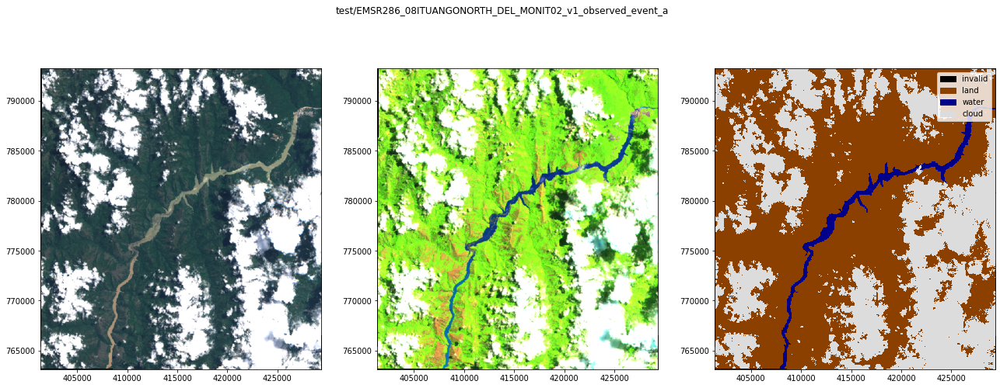

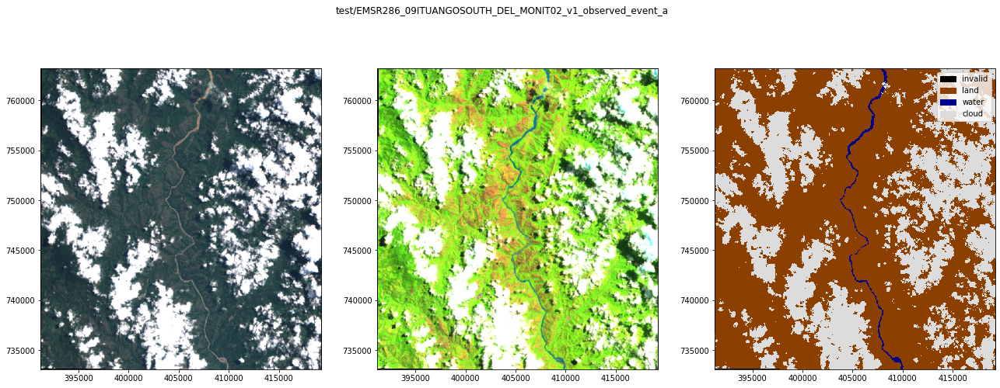

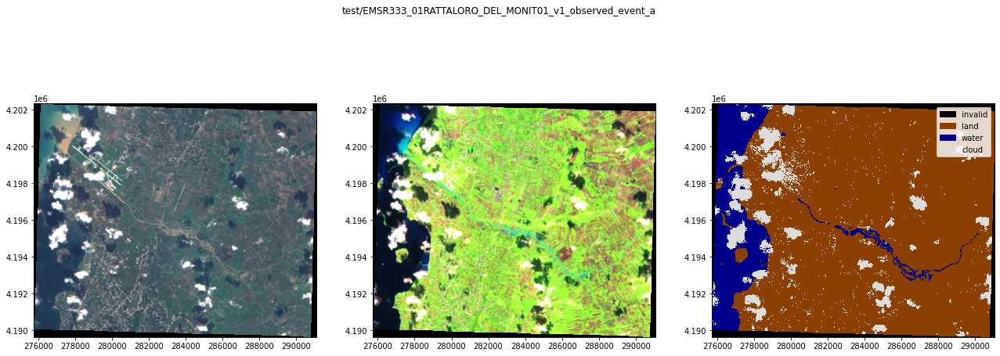

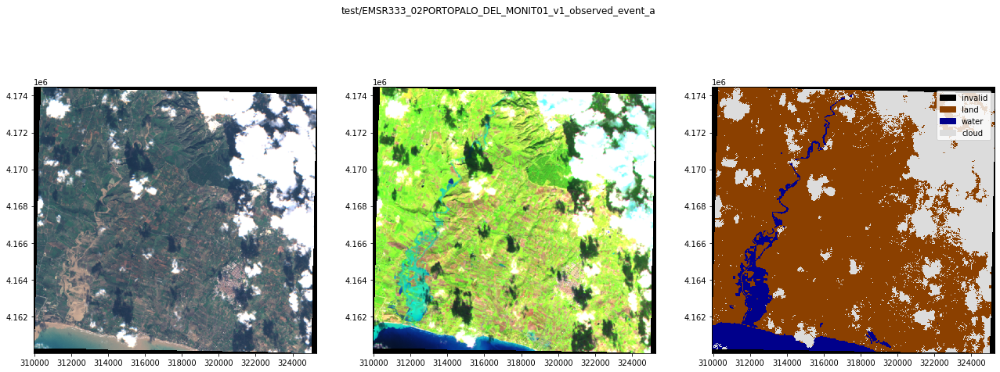

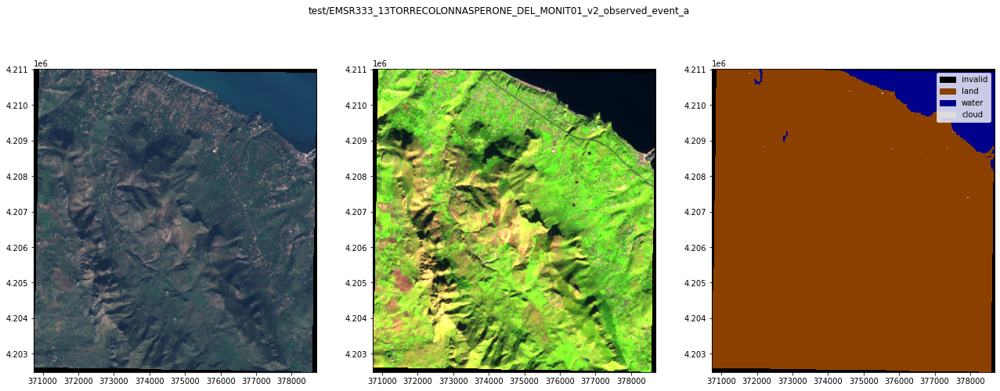

...

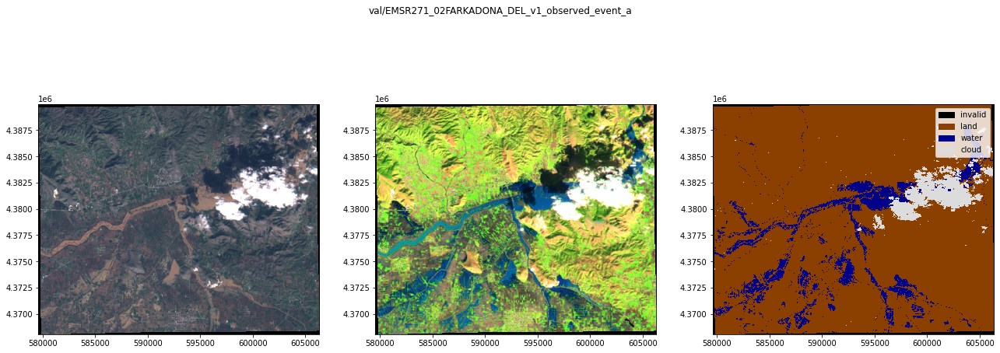

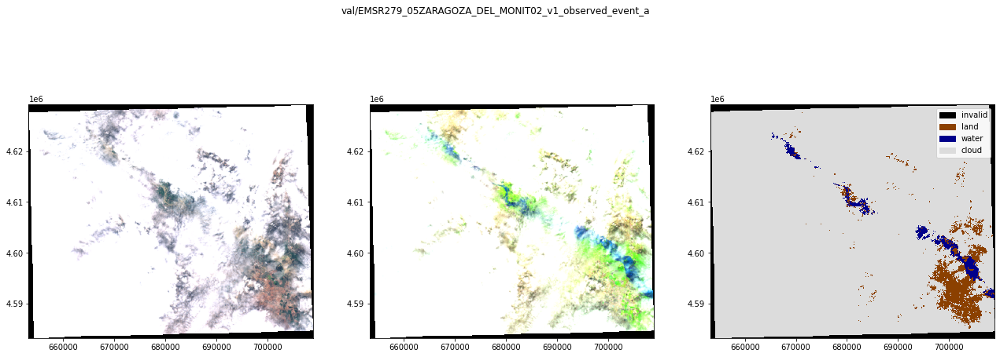

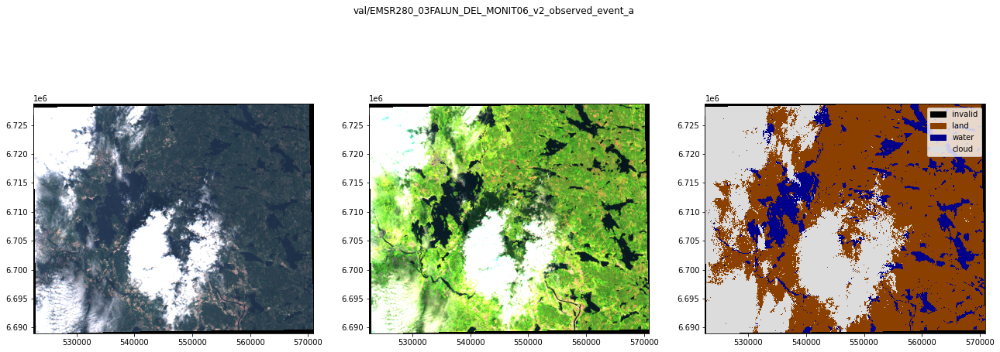

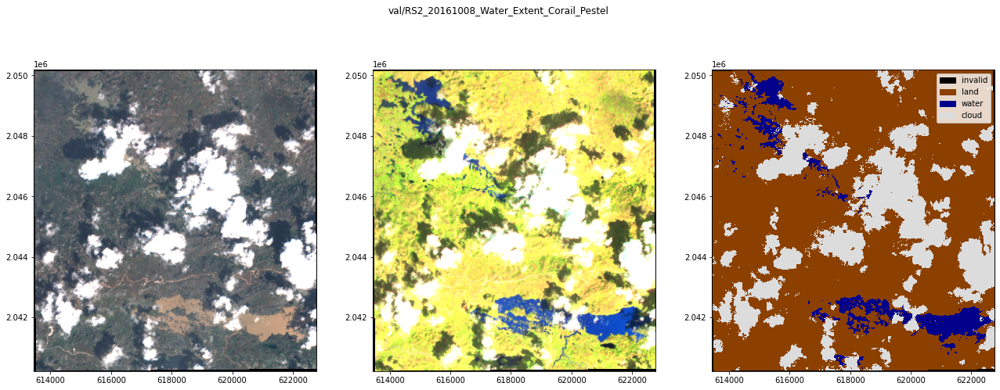

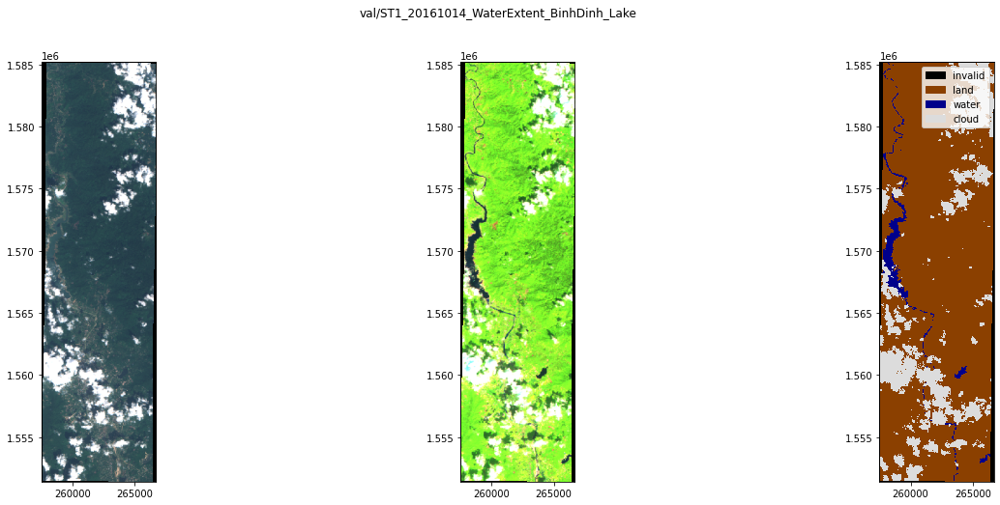

In [6]:
from ml4floods.visualization import plot_utils
import matplotlib.pyplot as plt

for s2_file in fs.glob("gs://ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/test/S2/*.tif") + fs.glob("gs://ml4cc_data_lake/0_DEV/2_Mart/worldfloods_extra_v2_0/val/S2/*.tif"):
    s2_file = f"gs://{s2_file}"
    fig, ax = plt.subplots(1,3,figsize=(22,8))
    plot_utils.plot_s2_rbg_image(s2_file,
                                 size_read=600, ax=ax[0])
    plot_utils.plot_s2_swirnirred_image(s2_file,
                                        size_read=600, ax=ax[1])   
    gt_file = s2_file.replace("/S2/","/gt/")
    plot_utils.plot_gt_v2(gt_file,
                          size_read=600, ax=ax[2])
    s2split = s2_file.split("/")
    title = f"{s2split[-3]}/{s2split[-1].replace('.tif','')}"
    plt.suptitle(title)
    plt.show()
    